<html style="background-color: white">
    <head style="background-color: white">
        <div style="position: relative; width: 1084px; margin: 50px auto; padding: 15px auto;">
            <figure style="max-width: 500px; float:left; padding: 10px; margin: 10px;">
                <a href="https://decide4ai.com/" target="_blank"><img style="padding: px; margin: 0;" src="./recursos/imagenes/FULLCOLOR.png" alt="logo decide"></a>
            </figure>
            <figure style="max-width: 500px; float:left; padding: 10px; margin: 32px 10px 10px 10px;">
                <a href="https://t3chfest.es/2023/" target="_blank"><img style="padding: 0; margin: 0;" src="./recursos/imagenes/t3f_logo.png" alt="logo t3ch festival"></a>
            </figure>
        </div>
        <div style="position: relative; border-top:3px solid #002060; border-bottom:3px solid #002060; margin-top: 300px; height: 96px; margin-right: auto; margin-left: auto;">
            <a href="./u1c6.ipynb" target="_blank"><img style="float: left; height: 64px; width: 76px;  margin:1% 1% 1% 7%;" src="./recursos/imagenes/ICON-FULLCOLOR-ROT.png" alt="icono decide4ai rotado"></a>
            <h1 style="color: #002060; text-align: center; margin: 2% 0; padding: 0; width: 70%; float: left;">
                Unidad 2: Motores de recomendación basados en contenido<br><a href="./indice.ipynb" style="font-size: 10px; color: #bf27b8">Volver al índice</a>
            </h1>
            <a href="./u3.ipynb" target="_blank"><img style="float: left; height: 64px; width: 76px; margin:1% auto 1% 1%;" src="./recursos/imagenes/ICON-FULLCOLOR.png" alt="icono decide4ai"></a>
        </div>
    </head>
    <body>
        <h1 style="color: #002060; margin-top: 100px;">Motores de recomendación basados en contenido</h1>
        <p style="font-size: 18px; color: #002060;">
            Los algoritmos <strong>basados en contenido</strong> se basan en las características <strong>explícitas</strong> de los ítems para hacer recomendaciones. 
        </p>
        <p style="font-size: 18px; color: #002060;">
            Estos algoritmos tratan de encontrar ítems similares basados en las características explícitas de estos para posteriormente recomendarlos al usuario. La idea subyacente de estos algoritmos es que si un usuario ha demostrado interés por un ítem con características similares en el pasado, es probable que tenga interés en otros ítems con características similares en el futuro.
        </p>
        <p style="font-size: 18px; color: #002060;">
        Para construir un sistema de recomendación basado en contenido necesitamos información sobre los ítems (datos sobre los datos -> metadatos), esto es, por ejemplo, que la prenda sea de un color u otro, los géneros de una película, los actores de una serie, el texto de un libro. Estas variables de muchos tipos, cuantitativas (binarias, numéricas), categóricas, texto, etc. Pero todas son variables de contenido, es decir, detallan el producto. Vamos a explicar dos formas de hacer esto, con los datos de H&M, una es mediante la <strong>similaridad del coseno</strong> y otra es con los <strong>K vecinos más cercanos</strong>.
        </p>
        <div style="position:relative; width: 458px; margin: 50px auto; padding: 15px auto;">
            <figure style="width: 458px; height: 450px; padding: 0 40px; margin: 0; text-align: center; color: #002060;">
                <img style="width: 450px; height: 450px; padding: 0; margin: 0" src="./recursos/imagenes/CB_esquema.png" alt="CB esquema">
                <figcaption>Esquema del funcionamiento de un sistema de recomendación Content-Based</figcaption>
            </figure>
        </div>
        <h2 style="color: #f47b4c; margin-top: 100px;">Ejemplo introducctorio</h2>
        <p style="font-size: 18px; color: #002060;">
            Veamos el funcionamiento básico de un sistema basado en contenido definiendo nosotros mismos un set de datos de prueba.
        </p>
    </body>
</html>

In [1]:
import pandas as pd
import numpy as np
import tools
import itertools as it
from IPython.display import Image
from tqdm.notebook import tqdm
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
tqdm.pandas()
pd.set_option("display.max_columns", None)
sns.set()
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


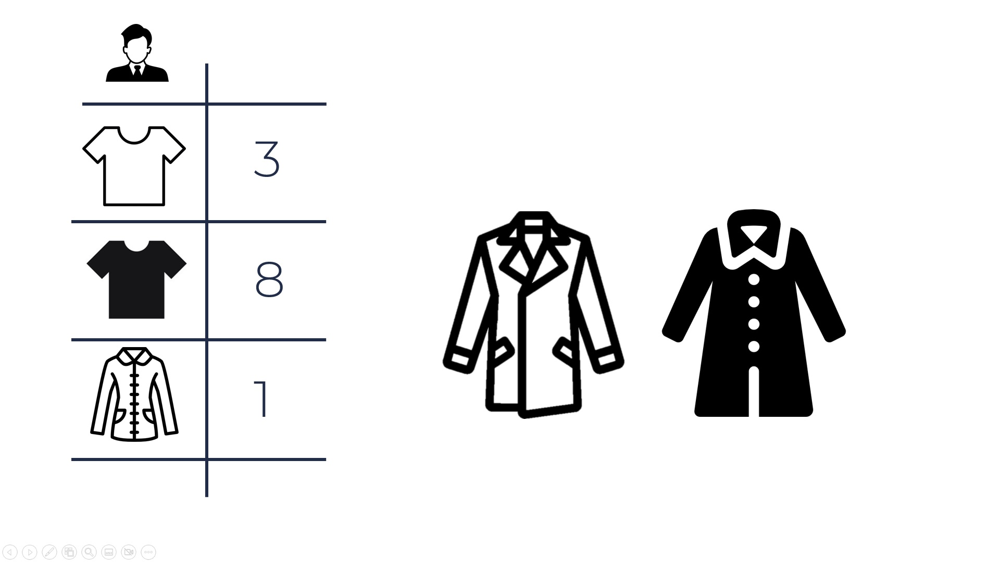

,ventas
camiseta_blanca,3
camiseta_negra,8
abrigo_blanco_mujer,1


In [2]:
display(Image(filename="./recursos/imagenes/contentbased/cb_01.jpg"))
sales_df = pd.DataFrame(pd.Series({'camiseta_blanca':3, 'camiseta_negra':8, 'abrigo_blanco_mujer':1}, name='ventas'))
display(pd.DataFrame(sales_df))

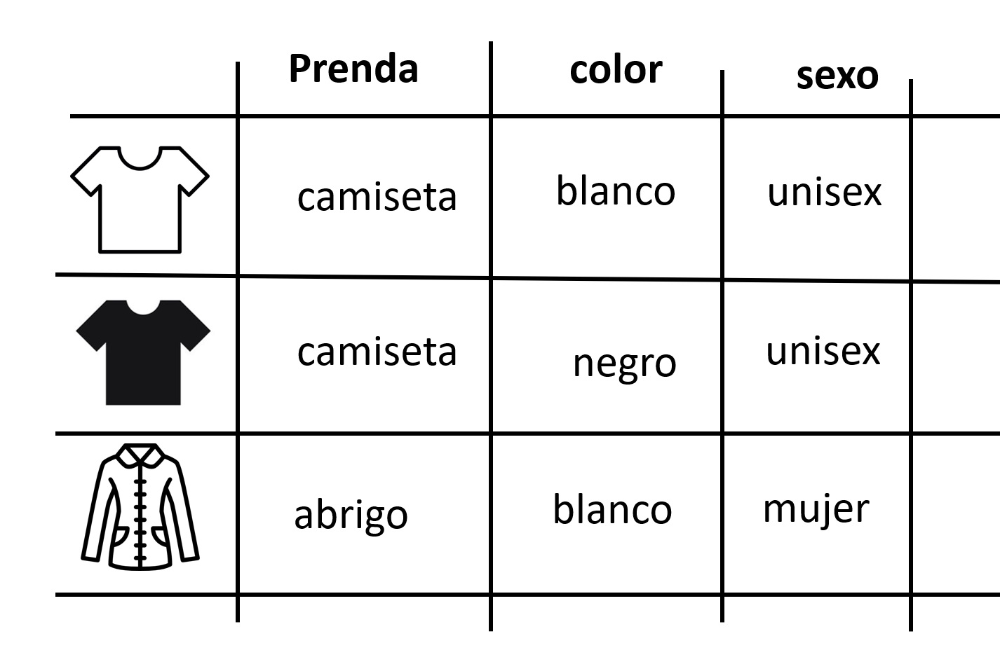

,prenda,color,sexo
camiseta_blanca,camiseta,blanco,unisex
camiseta_negra,camiseta,negro,unisex
abrigo_blanco_mujer,abrigo,blanco,mujer


In [3]:
display(Image(filename="./recursos/imagenes/contentbased/cb_02.jpg"))
product_df = pd.DataFrame(
    data={
        'prenda':['camiseta', 'camiseta', 'abrigo'],
         'color':['blanco', 'negro', 'blanco'],
         'sexo':['unisex', 'unisex', 'mujer']
    }, index=['camiseta_blanca', 'camiseta_negra', 'abrigo_blanco_mujer']
)
display(product_df)

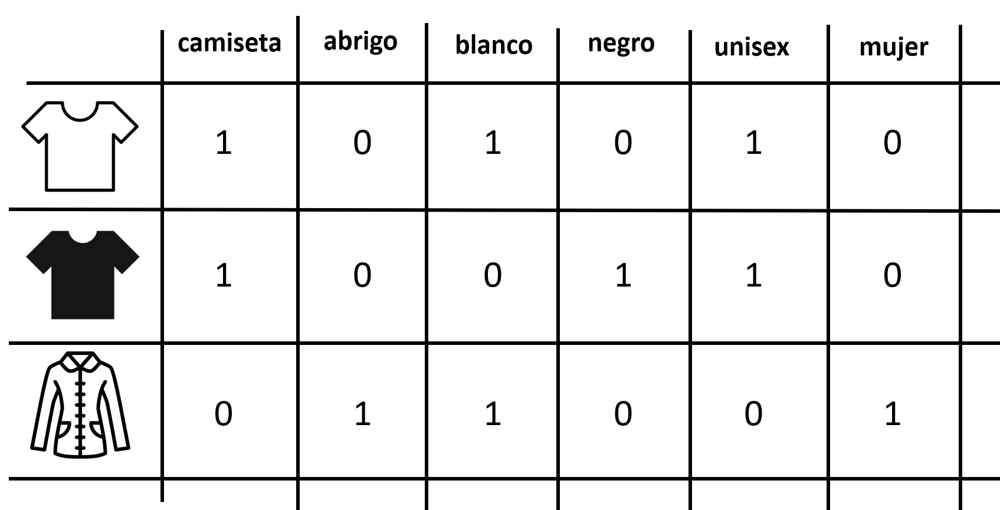

,camiseta,abrigo,blanco,negro,unisex,mujer
camiseta_blanca,1,0,1,0,1,0
camiseta_negra,1,0,0,1,1,0
abrigo_blanco_mujer,0,1,1,0,0,1


In [4]:
display(Image(filename="./recursos/imagenes/contentbased/cb_03.jpg"))
product_oh_df = pd.get_dummies(
    product_df, prefix_sep='', prefix=''
)[['camiseta', 'abrigo', 'blanco', 'negro', 'unisex', 'mujer']]
display(product_oh_df)

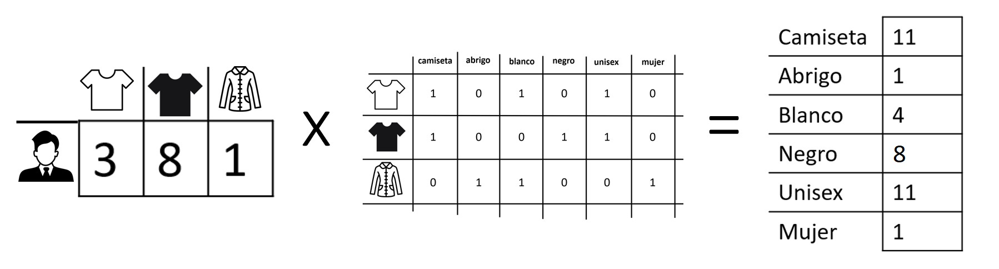

,usuario
camiseta,11
abrigo,1
blanco,4
negro,8
unisex,11
mujer,1


In [5]:
display(Image(filename="./recursos/imagenes/contentbased/cb_04.jpg"))

user_feat_df = pd.DataFrame(
    data={'usuario':np.dot(sales_df.squeeze().values, product_oh_df.values)}, 
    index=product_oh_df.columns
)
display(user_feat_df)

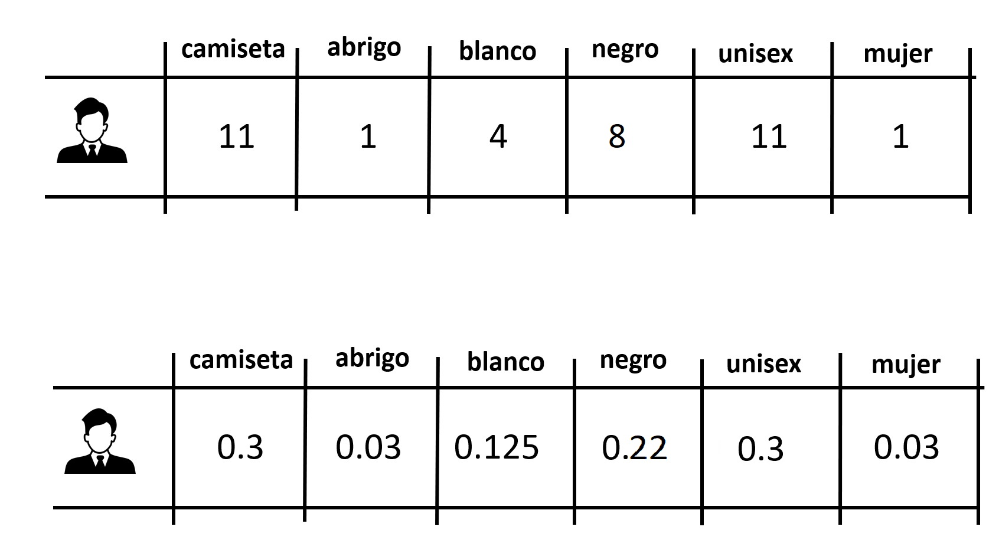

,usuario
camiseta,0.305556
abrigo,0.027778
blanco,0.111111
negro,0.222222
unisex,0.305556
mujer,0.027778


In [6]:
display(Image(filename="./recursos/imagenes/contentbased/cb_05.jpg") )
user_feat_df = user_feat_df/user_feat_df.sum().T
user_feat_df

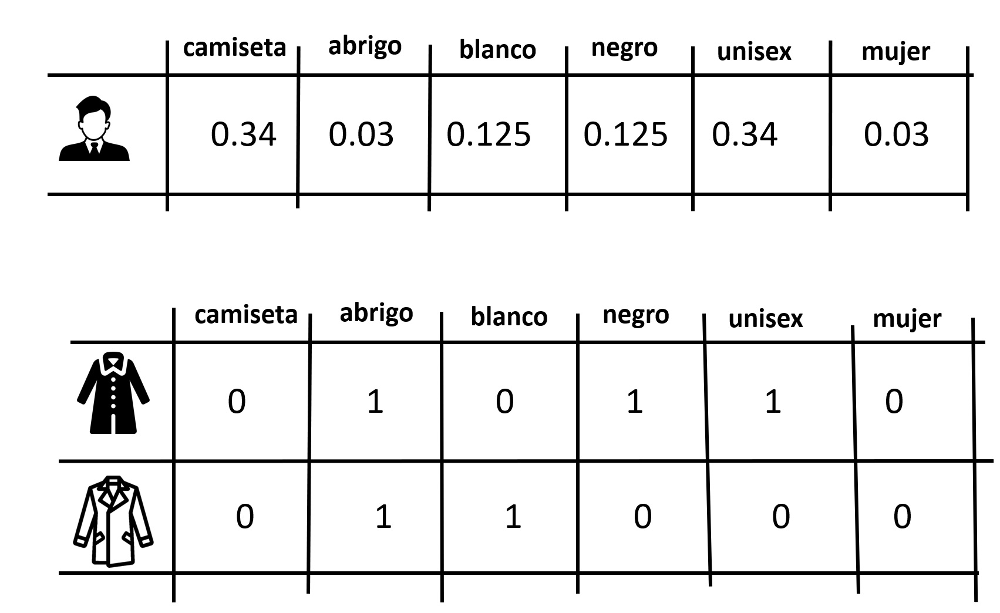

,camiseta,abrigo,blanco,negro,unisex,mujer
abrigo_negro_unisex,0,1,0,1,1,0
abrigo_blanco_hombre,0,1,1,0,0,0


In [7]:
display(Image(filename="./recursos/imagenes/contentbased/cb_06.jpg"))
recommendable_prod_df = pd.DataFrame(
    {
        'camiseta':[0, 0],
         'abrigo':[1,1],
         'blanco':[0, 1],
         'negro':[1,0],
         'unisex':[1, 0],
         'mujer':[0,0]
    }, index=['abrigo_negro_unisex', 'abrigo_blanco_hombre']
)
recommendable_prod_df

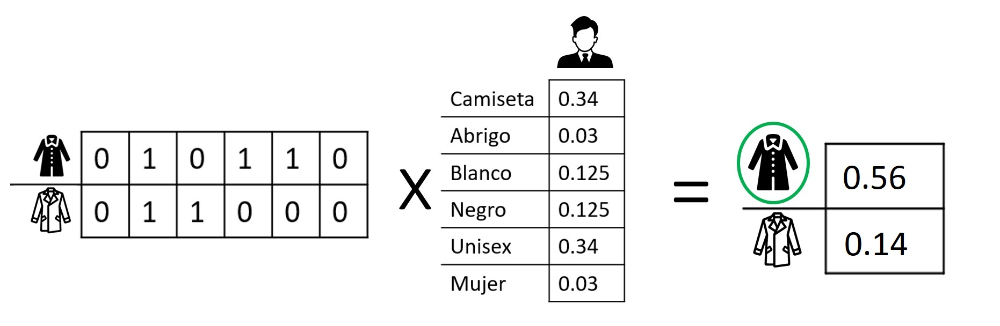

,score
abrigo_negro_unisex,0.56
abrigo_blanco_hombre,0.14


In [8]:
display(Image(filename="./recursos/imagenes/contentbased/cb_07.jpg"))
score_df = pd.DataFrame(
    data=np.dot(recommendable_prod_df.values, user_feat_df), index=recommendable_prod_df.index, columns=['score']
)
score_df.round(2)

<h1 style="color: #f47b4c; margin-top: 100px;">Aplicación a un caso real</h2>
        <p style="font-size: 18px; color: #002060;">
            Ahora probemos lo aprendido en un dataset de verdad.
        </p>

In [9]:
configuration = tools.read_config_data()

dtypes_transactions = configuration.get("DTYPES_TRANSACTIONS")
dtypes_transactions = {
    key: eval(value) if value.startswith("np") else value for key, value in dtypes_transactions.items()
}

path_transactions = "./recursos/datos/transactions_small.csv"
transactions = pd.read_csv(path_transactions, dtype=dtypes_transactions)

dtypes_customers = configuration.get("DTYPES_CUSTOMERS")
dtypes_customers = {
    key: eval(value) if value.startswith("np") else value for key, value in dtypes_customers.items()
}

path_customers = "./recursos/datos/customers.csv"
customers = pd.read_csv(path_customers, dtype=dtypes_customers)
customers = customers.reset_index(drop=False, names="cid")
customers["cid"] = (customers["cid"] + 1).astype(str).str.zfill(7)

dtypes_articles = configuration.get("DTYPES_ARTICLES")
dtypes_articles = {
    key: eval(value) if value.startswith("np") else value for key, value in dtypes_articles.items()
}

path_articles = "./recursos/datos/articles.csv"
articles = pd.read_csv(path_articles, dtype=dtypes_articles)

In [10]:
transactions = pd.merge(
    left=transactions, right=customers, 
    how="inner", on="customer_id"
)
customer_features = ['customer_id', 'cid', 'fashion_news_frequency','Active','age', 'club_member_status']
 
article_features = [
    'article_id', 'product_type_name', 'product_group_name', 'graphical_appearance_name', 
    'colour_group_name', 'perceived_colour_value_name', 'section_name' , 'garment_group_name' 
]
selected_features = list(it.chain(*[customer_features, article_features ]))

df = pd.merge(transactions, articles)[selected_features]
df['article_id'] = df['article_id'].astype(np.int64)
full_articles_df = df.drop_duplicates(subset=['article_id'])
full_articles_df['article_id'] = full_articles_df['article_id'].astype(np.int64)
full_articles_oh_df = pd.get_dummies(full_articles_df[article_features].set_index('article_id'), dummy_na=True)
del transactions
del customers
del articles

C:\Users\AngelLuengo\AppData\Local\Temp\ipykernel_7264\3069273988.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_articles_df['article_id'] = full_articles_df['article_id'].astype(np.int64)


<h2 style="color: #f47b4c; margin-top: 25px;">Naive Approach</h2>
        <p style="font-size: 18px; color: #002060;">
            Apliquemos el algoritmo aprendido a un set de datos real
        </p>
        
<ul style="text-align: left; font-size: 18px; color: #002060;">
        <li style="margin: 20px 0;"><strong>Cliente Único</strong></li>
            <p style="font-size: 15px; color: #002060;">
            Aplicarmos el algortimo a un único usuario
        </p>
</ul>

In [11]:
customer_sales = df.groupby('cid').count()['article_id']
customer_id = customer_sales[customer_sales == 100].sample(1).index[0]
customer_df = df.loc[df.cid == customer_id]
customer_df

,customer_id,cid,fashion_news_frequency,Active,age,club_member_status,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
29293,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,706016015,Trousers,Garment Lower body,Solid,Dark Grey,Dark,Divided Collection,Trousers
64669,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,811835001,Bikini top,Swimwear,Solid,Black,Dark,"Womens Swimwear, beachwear",Swimwear
67673,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,806225002,Bikini top,Swimwear,Solid,Black,Dark,"Womens Swimwear, beachwear",Swimwear
79167,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,539723005,Trousers,Garment Lower body,Solid,Light Blue,Light,Divided Collection,Trousers
79168,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,539723005,Trousers,Garment Lower body,Solid,Light Blue,Light,Divided Collection,Trousers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1372056,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,399223034,Trousers,Garment Lower body,All over pattern,Black,Dark,Ladies Denim,Trousers Denim
1400654,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,723347001,Bikini top,Swimwear,Other structure,Black,Dark,"Womens Swimwear, beachwear",Swimwear
1404544,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,721990006,Swimwear bottom,Swimwear,Solid,Black,Dark,"Womens Swimwear, beachwear",Swimwear
1404545,79ce31ceb9d34ec1018ee832110aadb2e3cc04a1b3f64c...,0652707,NONE,NaN,54.0,ACTIVE,721990006,Swimwear bottom,Swimwear,Solid,Black,Dark,"Womens Swimwear, beachwear",Swimwear



<ul style="text-align: left; font-size: 18px; color: #002060;">
            <p style="font-size: 18px; color: #002060;">
            1. Calculamos las compras del usuario y los productos disponibles 
        </p>
</ul>


In [12]:
sales_df = customer_df.groupby('article_id').count()['cid'].reset_index().rename(
    columns={'cid':'number_of_sales'}
).set_index('article_id').sort_index()
sales_df.head()

,number_of_sales
article_id,
212629048,1
399223001,2
399223029,1
399223034,1
408875001,2


In [13]:
article_df = customer_df.drop_duplicates(
    subset=['article_id']
).drop(columns=['cid'])[article_features].set_index('article_id').sort_index()
display(article_df.head())
articles_oh_df = pd.get_dummies(article_df).sort_index()
display(articles_oh_df.head())

,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
article_id,,,,,,,
212629048,Dress,Garment Full body,Solid,Dark Pink,Dark,Divided Basics,Jersey Basic
399223001,Trousers,Garment Lower body,Solid,Black,Dark,Ladies Denim,Trousers Denim
399223029,Trousers,Garment Lower body,Denim,Black,Dark,Ladies Denim,Trousers Denim
399223034,Trousers,Garment Lower body,All over pattern,Black,Dark,Ladies Denim,Trousers Denim
408875001,Vest top,Garment Upper body,Solid,Black,Dark,Divided Basics,Jersey Basic


,product_type_name_Belt,product_type_name_Bikini top,product_type_name_Bra,product_type_name_Cardigan,product_type_name_Dress,product_type_name_Jacket,product_type_name_Leggings/Tights,product_type_name_Pyjama set,product_type_name_Shirt,product_type_name_Shorts,product_type_name_Sweater,product_type_name_Swimwear bottom,product_type_name_T-shirt,product_type_name_Top,product_type_name_Trousers,product_type_name_Underwear bottom,product_type_name_Vest top,product_group_name_Accessories,product_group_name_Garment Full body,product_group_name_Garment Lower body,product_group_name_Garment Upper body,product_group_name_Nightwear,product_group_name_Swimwear,product_group_name_Underwear,graphical_appearance_name_All over pattern,graphical_appearance_name_Colour blocking,graphical_appearance_name_Contrast,graphical_appearance_name_Denim,graphical_appearance_name_Front print,graphical_appearance_name_Melange,graphical_appearance_name_Other structure,graphical_appearance_name_Placement print,graphical_appearance_name_Solid,graphical_appearance_name_Stripe,colour_group_name_Black,colour_group_name_Blue,colour_group_name_Dark Beige,colour_group_name_Dark Blue,colour_group_name_Dark Green,colour_group_name_Dark Grey,colour_group_name_Dark Orange,colour_group_name_Dark Pink,colour_group_name_Dark Red,colour_group_name_Grey,colour_group_name_Light Beige,colour_group_name_Light Blue,colour_group_name_Light Pink,colour_group_name_Off White,colour_group_name_White,perceived_colour_value_name_Dark,perceived_colour_value_name_Dusty Light,perceived_colour_value_name_Light,section_name_Divided Accessories,section_name_Divided Basics,section_name_Divided Collection,section_name_Divided Complements Other,section_name_Ladies Denim,section_name_Ladies H&M Sport,section_name_Womens Big accessories,section_name_Womens Everyday Basics,section_name_Womens Everyday Collection,section_name_Womens Jackets,section_name_Womens Lingerie,"section_name_Womens Nightwear, Socks & Tigh","section_name_Womens Swimwear, beachwear",section_name_Womens Tailoring,garment_group_name_Accessories,garment_group_name_Blouses,garment_group_name_Dresses Ladies,garment_group_name_Jersey Basic,garment_group_name_Jersey Fancy,garment_group_name_Knitwear,garment_group_name_Outdoor,garment_group_name_Shorts,garment_group_name_Swimwear,garment_group_name_Trousers,garment_group_name_Trousers Denim,"garment_group_name_Under-, Nightwear"
article_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
212629048,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
399223001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
399223029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
399223034,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
408875001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0



<ul style="text-align: left; font-size: 18px; color: #002060;">
            <p style="font-size: 18px; color: #002060;">
            2. Calculamos el vector de afinidad del cliente
        </p>
</ul>


In [14]:
affinity = np.dot(sales_df.values.reshape(1, -1), articles_oh_df.values)
affinity = affinity/affinity.sum()
affinity_df = pd.DataFrame(affinity, columns=articles_oh_df.columns, index=[customer_id])
affinity_df.columns = sorted(affinity_df.columns)
display(affinity_df)
print(affinity_df.values.flatten())

,colour_group_name_Black,colour_group_name_Blue,colour_group_name_Dark Beige,colour_group_name_Dark Blue,colour_group_name_Dark Green,colour_group_name_Dark Grey,colour_group_name_Dark Orange,colour_group_name_Dark Pink,colour_group_name_Dark Red,colour_group_name_Grey,colour_group_name_Light Beige,colour_group_name_Light Blue,colour_group_name_Light Pink,colour_group_name_Off White,colour_group_name_White,garment_group_name_Accessories,garment_group_name_Blouses,garment_group_name_Dresses Ladies,garment_group_name_Jersey Basic,garment_group_name_Jersey Fancy,garment_group_name_Knitwear,garment_group_name_Outdoor,garment_group_name_Shorts,garment_group_name_Swimwear,garment_group_name_Trousers,garment_group_name_Trousers Denim,"garment_group_name_Under-, Nightwear",graphical_appearance_name_All over pattern,graphical_appearance_name_Colour blocking,graphical_appearance_name_Contrast,graphical_appearance_name_Denim,graphical_appearance_name_Front print,graphical_appearance_name_Melange,graphical_appearance_name_Other structure,graphical_appearance_name_Placement print,graphical_appearance_name_Solid,graphical_appearance_name_Stripe,perceived_colour_value_name_Dark,perceived_colour_value_name_Dusty Light,perceived_colour_value_name_Light,product_group_name_Accessories,product_group_name_Garment Full body,product_group_name_Garment Lower body,product_group_name_Garment Upper body,product_group_name_Nightwear,product_group_name_Swimwear,product_group_name_Underwear,product_type_name_Belt,product_type_name_Bikini top,product_type_name_Bra,product_type_name_Cardigan,product_type_name_Dress,product_type_name_Jacket,product_type_name_Leggings/Tights,product_type_name_Pyjama set,product_type_name_Shirt,product_type_name_Shorts,product_type_name_Sweater,product_type_name_Swimwear bottom,product_type_name_T-shirt,product_type_name_Top,product_type_name_Trousers,product_type_name_Underwear bottom,product_type_name_Vest top,section_name_Divided Accessories,section_name_Divided Basics,section_name_Divided Collection,section_name_Divided Complements Other,section_name_Ladies Denim,section_name_Ladies H&M Sport,section_name_Womens Big accessories,section_name_Womens Everyday Basics,section_name_Womens Everyday Collection,section_name_Womens Jackets,section_name_Womens Lingerie,"section_name_Womens Nightwear, Socks & Tigh","section_name_Womens Swimwear, beachwear",section_name_Womens Tailoring
0652707,0.002857,0.015714,0.002857,0.004286,0.01,0.001429,0.002857,0.001429,0.001429,0.017143,0.007143,0.01,0.007143,0.005714,0.03,0.002857,0.02,0.002857,0.01,0.05,0.047143,0.001429,0.025714,0.005714,0.012857,0.002857,0.001429,0.007143,0.001429,0.007143,0.005714,0.001429,0.092857,0.01,0.08,0.004286,0.002857,0.005714,0.004286,0.008571,0.001429,0.001429,0.001429,0.004286,0.008571,0.005714,0.001429,0.001429,0.011429,0.105714,0.017143,0.02,0.001429,0.014286,0.022857,0.002857,0.005714,0.005714,0.001429,0.007143,0.041429,0.001429,0.005714,0.004286,0.025714,0.002857,0.002857,0.004286,0.002857,0.024286,0.017143,0.008571,0.001429,0.017143,0.025714,0.022857,0.005714,0.01


[0.00285714 0.01571429 0.00285714 0.00428571 0.01       0.00142857
 0.00285714 0.00142857 0.00142857 0.01714286 0.00714286 0.01
 0.00714286 0.00571429 0.03       0.00285714 0.02       0.00285714
 0.01       0.05       0.04714286 0.00142857 0.02571429 0.00571429
 0.01285714 0.00285714 0.00142857 0.00714286 0.00142857 0.00714286
 0.00571429 0.00142857 0.09285714 0.01       0.08       0.00428571
 0.00285714 0.00571429 0.00428571 0.00857143 0.00142857 0.00142857
 0.00142857 0.00428571 0.00857143 0.00571429 0.00142857 0.00142857
 0.01142857 0.10571429 0.01714286 0.02       0.00142857 0.01428571
 0.02285714 0.00285714 0.00571429 0.00571429 0.00142857 0.00714286
 0.04142857 0.00142857 0.00571429 0.00428571 0.02571429 0.00285714
 0.00285714 0.00428571 0.00285714 0.02428571 0.01714286 0.00857143
 0.00142857 0.01714286 0.02571429 0.02285714 0.00571429 0.01      ]



<ul style="text-align: left; font-size: 18px; color: #002060;">
            <p style="font-size: 18px; color: #002060;">
            3. Calculamos los productos recomendables
        </p>
</ul>


In [15]:
recommendable_articles_df = (
    full_articles_df.loc[full_articles_df.cid != customer_id]
    .drop_duplicates(subset=["article_id"])[article_features]
    .set_index("article_id")
)
display(recommendable_articles_df.head())
recommendable_articles_oh_df = pd.get_dummies(
    recommendable_articles_df, dummy_na=True
).sort_index()

common_feats = [
    feat
    for feat in recommendable_articles_oh_df.columns
    if feat in affinity_df.columns
]
recommendable_articles_oh_df = recommendable_articles_oh_df[common_feats]
affinity_df = affinity_df[common_feats]

display(recommendable_articles_oh_df[common_feats])

,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
article_id,,,,,,,
611415005,Underwear bottom,Underwear,Solid,Dark Red,Medium,Womens Lingerie,"Under-, Nightwear"
673677002,Sweater,Garment Upper body,Solid,Black,Dark,Womens Tailoring,Knitwear
611415001,Underwear bottom,Underwear,Solid,Black,Dark,Womens Lingerie,"Under-, Nightwear"
200182001,Underwear Tights,Socks & Tights,Solid,Black,Dark,"Womens Nightwear, Socks & Tigh",Socks and Tights
240561001,Underwear Tights,Socks & Tights,Solid,Black,Dark,"Womens Nightwear, Socks & Tigh",Socks and Tights


,product_type_name_Belt,product_type_name_Bikini top,product_type_name_Bra,product_type_name_Cardigan,product_type_name_Dress,product_type_name_Jacket,product_type_name_Leggings/Tights,product_type_name_Pyjama set,product_type_name_Shirt,product_type_name_Shorts,product_type_name_Sweater,product_type_name_Swimwear bottom,product_type_name_T-shirt,product_type_name_Top,product_type_name_Trousers,product_type_name_Underwear bottom,product_type_name_Vest top,product_group_name_Accessories,product_group_name_Garment Full body,product_group_name_Garment Lower body,product_group_name_Garment Upper body,product_group_name_Nightwear,product_group_name_Swimwear,product_group_name_Underwear,graphical_appearance_name_All over pattern,graphical_appearance_name_Colour blocking,graphical_appearance_name_Contrast,graphical_appearance_name_Denim,graphical_appearance_name_Front print,graphical_appearance_name_Melange,graphical_appearance_name_Other structure,graphical_appearance_name_Placement print,graphical_appearance_name_Solid,graphical_appearance_name_Stripe,colour_group_name_Black,colour_group_name_Blue,colour_group_name_Dark Beige,colour_group_name_Dark Blue,colour_group_name_Dark Green,colour_group_name_Dark Grey,colour_group_name_Dark Orange,colour_group_name_Dark Pink,colour_group_name_Dark Red,colour_group_name_Grey,colour_group_name_Light Beige,colour_group_name_Light Blue,colour_group_name_Light Pink,colour_group_name_Off White,colour_group_name_White,perceived_colour_value_name_Dark,perceived_colour_value_name_Dusty Light,perceived_colour_value_name_Light,section_name_Divided Accessories,section_name_Divided Basics,section_name_Divided Collection,section_name_Divided Complements Other,section_name_Ladies Denim,section_name_Ladies H&M Sport,section_name_Womens Big accessories,section_name_Womens Everyday Basics,section_name_Womens Everyday Collection,section_name_Womens Jackets,section_name_Womens Lingerie,"section_name_Womens Nightwear, Socks & Tigh","section_name_Womens Swimwear, beachwear",section_name_Womens Tailoring,garment_group_name_Accessories,garment_group_name_Blouses,garment_group_name_Dresses Ladies,garment_group_name_Jersey Basic,garment_group_name_Jersey Fancy,garment_group_name_Knitwear,garment_group_name_Outdoor,garment_group_name_Shorts,garment_group_name_Swimwear,garment_group_name_Trousers,garment_group_name_Trousers Denim,"garment_group_name_Under-, Nightwear"
article_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
108775015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
108775044,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
111565001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111586001,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111593001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
883033001,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
883033002,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
915526001,0,0


<ul style="text-align: left; font-size: 18px; color: #002060;">
            <p style="font-size: 18px; color: #002060;">
            4. Recomendamos los top K productos al cliente
        </p>
</ul>


In [16]:
K = 5
recommendation_df = pd.DataFrame(
    np.dot(
        affinity_df.values.reshape(1, -1), recommendable_articles_oh_df.T.values
    ),
    columns=recommendable_articles_oh_df.index.tolist(),
    index=["affinity"],
).T.sort_values(by=["affinity"], ascending=False)
recommendation_df.index.names = ["article_id"]
display(recommendation_df.head())
recommended = recommendation_df.head(K).index.tolist()
print(recommended)

,affinity
article_id,
740922001,0.221429
879781003,0.202857
757303002,0.197143
741040001,0.194286
564786001,0.194286


[740922001, 879781003, 757303002, 741040001, 564786001]


<ul style="text-align: left; font-size: 18px; color: #002060;">
        <li style="margin: 20px 0;"><strong>Múltiples Clientes</strong></li>
            <p style="font-size: 15px; color: #002060;">
            Copiaremos la función orientada a un único cliente y la ejecutaremos para todos los clientes del dataset
        </p>
</ul>

In [22]:
def _get_customer_dfs(customer_df):
     # STUDENT CODE
    return sales_df, articles_oh_df

def _get_user_affinity(sales_df, articles_oh_df, customer_id):
    # STUDENT CODE
    return affinity_df


def _recommend(affinity_df, recommendable_articles_oh_df, K):
    # STUDENT CODE
    return recommended

def _get_recommendable_articles(full_articles_df, affinity_df, customer_id):
    recommendable_articles_df = (
        full_articles_df.loc[full_articles_df.cid != customer_id]
        .drop_duplicates(subset=["article_id"])[article_features]
        .set_index("article_id")
    )
    recommendable_articles_oh_df = pd.get_dummies(
        recommendable_articles_df, dummy_na=True
    ).sort_index()

    common_feats = [
        feat
        for feat in recommendable_articles_oh_df.columns
        if feat in affinity_df.columns
    ]
    recommendable_articles_oh_df = recommendable_articles_oh_df[common_feats]
    affinity_df = affinity_df[common_feats]

    return recommendable_articles_oh_df, affinity_df


def recommend_user(customer_df, customer_id, full_articles_df, K, algorithm="naive"):
    sales_df, articles_oh_df = _get_customer_dfs(customer_df)
    affinity_df = _get_user_affinity(sales_df, articles_oh_df, customer_id)
    recommendable_articles_oh_df, affinity_df = _get_recommendable_articles(
        full_articles_df, affinity_df, customer_id
    )
    return _recommend(affinity_df, recommendable_articles_oh_df, K)


In [23]:
K = 3
num_users = 10
selected_customers = df.groupby('cid')['product_type_name'].nunique().sort_values().head(
    num_users
).index

naive_recommendations_df = pd.DataFrame(df.loc[df.cid.isin(selected_customers)].groupby(
    'cid'
).progress_apply(
    lambda x:  recommend_user(x, x.name, full_articles_df, K, algorithm='naive')
).to_dict()).T
naive_recommendations_df.head()

  0%|          | 0/10 [00:00<?, ?it/s]

,0,1,2,3,4
0148074,740922001,879781003,757303002,741040001,564786001
0247511,740922001,879781003,757303002,741040001,564786001
0250296,740922001,879781003,757303002,741040001,564786001
0427302,740922001,879781003,757303002,741040001,564786001
0573341,740922001,879781003,757303002,741040001,564786001


In [24]:
recommendation_sample = naive_recommendations_df.sample(1).squeeze()
display(df.loc[df.cid == recommendation_sample.name][article_features].sample(10))
display(df.loc[df.article_id.isin(recommendation_sample.values)][article_features].drop_duplicates())

,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
701691,573716049,Trousers,Garment Lower body,Solid,Greenish Khaki,Dark,Womens Everyday Collection,Trousers
278718,562245001,Trousers,Garment Lower body,Solid,Black,Dark,Womens Everyday Collection,Trousers
1317052,562245025,Trousers,Garment Lower body,Solid,Light Pink,Dusty Light,Womens Everyday Collection,Trousers
701692,573716049,Trousers,Garment Lower body,Solid,Greenish Khaki,Dark,Womens Everyday Collection,Trousers
580524,568597007,Trousers,Garment Lower body,Solid,Dark Blue,Dark,Womens Tailoring,Trousers
378103,783346016,Trousers,Garment Lower body,Solid,Greenish Khaki,Medium Dusty,Womens Everyday Collection,Trousers
1140294,573716052,Trousers,Garment Lower body,Solid,Light Beige,Dusty Light,Womens Everyday Collection,Trousers
376239,783346018,Trousers,Garment Lower body,Solid,Dark Blue,Dark,Womens Everyday Collection,Trousers
657055,573716012,Trousers,Garment Lower body,Solid,Black,Dark,Womens Everyday Collection,Trousers
454066,695545001,Trousers,Garment Lower body,Solid,Black,Dark,Womens Everyday Collection,Trousers


,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
249151,564786001,Bra,Underwear,Solid,Black,Dark,Ladies H&M Sport,Jersey Fancy
539533,879781003,Top,Garment Upper body,Melange,Light Beige,Medium Dusty,Womens Tailoring,Knitwear
1067943,740922001,Top,Garment Upper body,Melange,Black,Dark,Ladies H&M Sport,Jersey Fancy
1156951,741040001,Bra,Underwear,Solid,Black,Dark,Ladies H&M Sport,Jersey Fancy
1224181,757303002,Bra,Underwear,Solid,Light Pink,Dusty Light,Ladies H&M Sport,Jersey Fancy


<h2 style="color: #f47b4c; margin-top: 25px;">Modelo de Distancias</h2>
<p style="font-size: 16px; color: #002060;"> En el caso anterior nos centramos en hacer el producto escalar entre el vector de características del usuario y la matriz de productos, pero existen otras métricas que permiten ver la similaridad entre el vector-usuario y el vector de características de productos.</p>

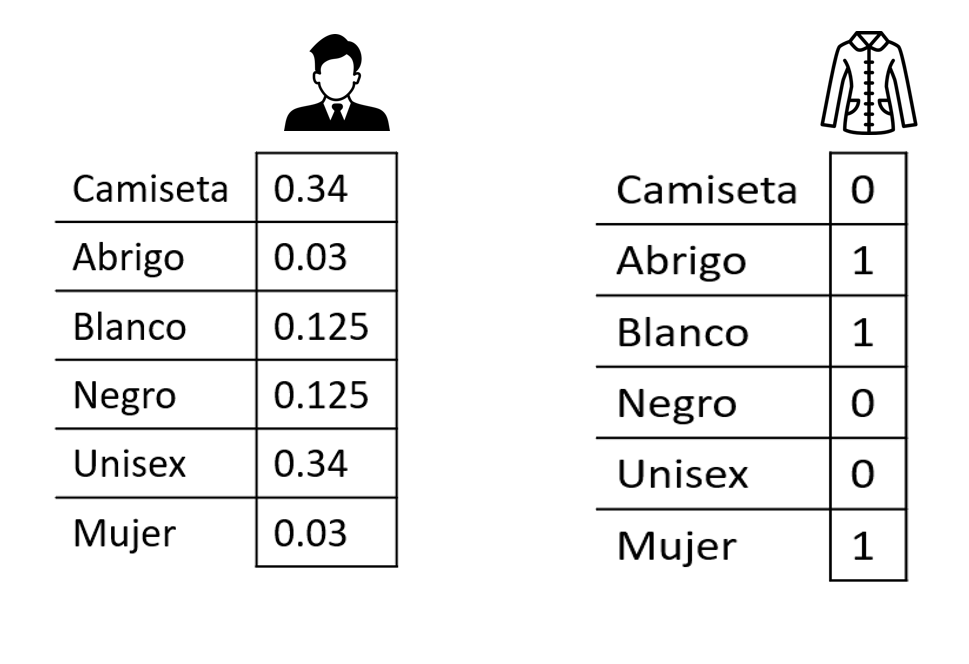

In [25]:
display(Image(filename="./recursos/imagenes/contentbased/cb_08.jpg"))

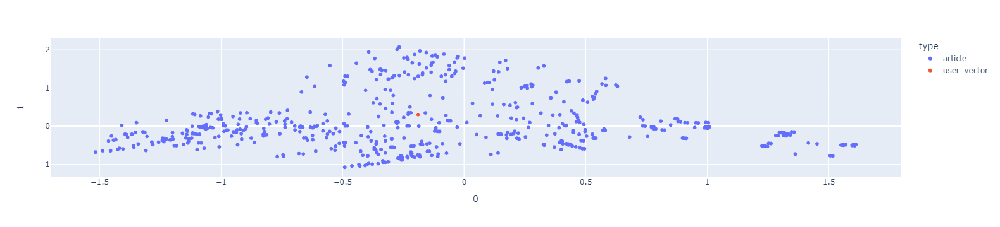

In [26]:
from sklearn import decomposition
import plotly.express as px

pca = decomposition.PCA(
    n_components=2
).fit(recommendable_articles_oh_df.values)

pca_recommended_df = pd.DataFrame(
    decomposition.PCA(
    n_components=2
).fit(recommendable_articles_oh_df.values).fit_transform(recommendable_articles_oh_df.values)
).set_index(recommendable_articles_oh_df.index)

pca_recommended_df['type_'] = 'article'
pca_affinity_df = pd.DataFrame(pca.transform(affinity_df.values)).reset_index(drop=False).rename(
    columns={'index':'article_id'}
)
pca_affinity_df['type_'] = 'user_vector'
px.scatter(
    data_frame=pd.concat([pca_recommended_df.reset_index(), pca_affinity_df]).reset_index(drop=True),
    x=0,
    y=1,
    hover_data=['article_id'],
    color='type_'
)

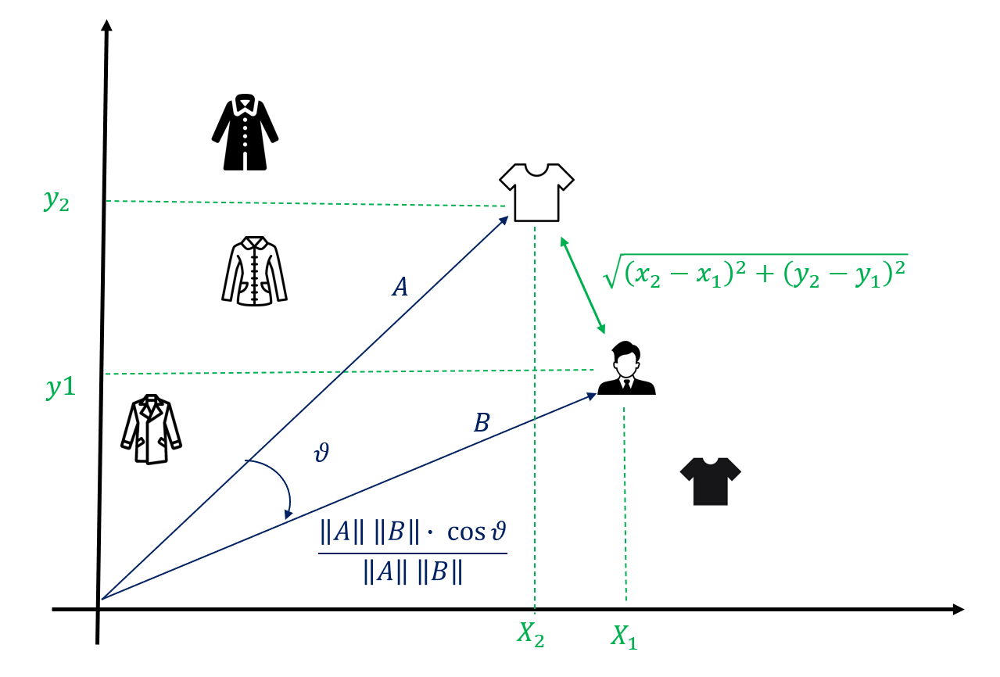

In [27]:
display(Image(filename="./recursos/imagenes/contentbased/cb_09.jpg"))

<ul style="text-align: left; font-size: 18px; color: #002060;">
        <li style="margin: 20px 0;"><strong>Único Cliente</strong></li>
            <p style="font-size: 15px; color: #002060;">
            Una vez calculado el vector del cliente (affinity), calcular la distancia a la que están los demás clientes es directo
        </p>
</ul>

In [28]:
sample_article= recommendable_articles_oh_df.head(1).T
affinity_vector = affinity_df.values.flatten()
sample_article_vector = sample_article.values.flatten()
display(affinity_df.T.head())

print('vector cliente', affinity_vector,'\n')
display(sample_article)
print('vector producto',sample_article_vector)
print()

,0652707
product_type_name_Belt,0.001429
product_type_name_Bikini top,0.011429
product_type_name_Bra,0.105714
product_type_name_Cardigan,0.017143
product_type_name_Dress,0.020000


vector cliente [0.00142857 0.01142857 0.10571429 0.01714286 0.02       0.00142857
 0.01428571 0.02285714 0.00285714 0.00571429 0.00571429 0.00142857
 0.00714286 0.04142857 0.00142857 0.00571429 0.00428571 0.00142857
 0.00142857 0.00142857 0.00428571 0.00857143 0.00571429 0.00142857
 0.00714286 0.00142857 0.00714286 0.00571429 0.00142857 0.09285714
 0.01       0.08       0.00428571 0.00285714 0.00285714 0.01571429
 0.00285714 0.00428571 0.01       0.00142857 0.00285714 0.00142857
 0.00142857 0.01714286 0.00714286 0.01       0.00714286 0.00571429
 0.03       0.00571429 0.00428571 0.00857143 0.02571429 0.00285714
 0.00285714 0.00428571 0.00285714 0.02428571 0.01714286 0.00857143
 0.00142857 0.01714286 0.02571429 0.02285714 0.00571429 0.01
 0.00285714 0.02       0.00285714 0.01       0.05       0.04714286
 0.00142857 0.02571429 0.00571429 0.01285714 0.00285714 0.00142857] 



article_id,108775015
product_type_name_Belt,0
product_type_name_Bikini top,0
product_type_name_Bra,0
product_type_name_Cardigan,0
product_type_name_Dress,0
...,...
garment_group_name_Shorts,0
garment_group_name_Swimwear,0
garment_group_name_Trousers,0
garment_group_name_Trousers Denim,0


vector producto [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0]



 <p style="font-size: 17px; color: #002060;">
            Calculemos la distancia del coseno entre los 2 vectores
        </p>

In [29]:
from sklearn.metrics.pairwise import cosine_similarity

def cosine_similarity_manual(a, b):
    return np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))



print(
    cosine_similarity_manual(sample_article_vector, affinity_vector), '|',
    cosine_similarity(
        sample_article_vector.reshape(1, -1),
        affinity_vector.reshape(1, -1)
    ).flatten()[0]
)

0.07432208249995159 | 0.07432208249995159


 <p style="font-size: 17px; color: #002060;">
            Calculemos la distancia del coseno entre el vector cliente y todos los demás vectores de clientes
    y quedémonos con los K más cercanos
        </p>

In [31]:
recommendable_articles_oh_df['cosine_similarity'] = cosine_similarity(
    affinity_df.values, recommendable_articles_oh_df.values
).flatten()

display(recommendable_articles_oh_df.sort_values(by=['cosine_similarity'], ascending=False))
recommended_articles = recommendable_articles_oh_df.sort_values(
    by=['cosine_similarity'], ascending=False
).head(K).index.tolist()
print(recommended_articles)
recommendable_articles_oh_df = recommendable_articles_oh_df.drop(columns=['cosine_similarity'])

,product_type_name_Belt,product_type_name_Bikini top,product_type_name_Bra,product_type_name_Cardigan,product_type_name_Dress,product_type_name_Jacket,product_type_name_Leggings/Tights,product_type_name_Pyjama set,product_type_name_Shirt,product_type_name_Shorts,product_type_name_Sweater,product_type_name_Swimwear bottom,product_type_name_T-shirt,product_type_name_Top,product_type_name_Trousers,product_type_name_Underwear bottom,product_type_name_Vest top,product_group_name_Accessories,product_group_name_Garment Full body,product_group_name_Garment Lower body,product_group_name_Garment Upper body,product_group_name_Nightwear,product_group_name_Swimwear,product_group_name_Underwear,graphical_appearance_name_All over pattern,graphical_appearance_name_Colour blocking,graphical_appearance_name_Contrast,graphical_appearance_name_Denim,graphical_appearance_name_Front print,graphical_appearance_name_Melange,graphical_appearance_name_Other structure,graphical_appearance_name_Placement print,graphical_appearance_name_Solid,graphical_appearance_name_Stripe,colour_group_name_Black,colour_group_name_Blue,colour_group_name_Dark Beige,colour_group_name_Dark Blue,colour_group_name_Dark Green,colour_group_name_Dark Grey,colour_group_name_Dark Orange,colour_group_name_Dark Pink,colour_group_name_Dark Red,colour_group_name_Grey,colour_group_name_Light Beige,colour_group_name_Light Blue,colour_group_name_Light Pink,colour_group_name_Off White,colour_group_name_White,perceived_colour_value_name_Dark,perceived_colour_value_name_Dusty Light,perceived_colour_value_name_Light,section_name_Divided Accessories,section_name_Divided Basics,section_name_Divided Collection,section_name_Divided Complements Other,section_name_Ladies Denim,section_name_Ladies H&M Sport,section_name_Womens Big accessories,section_name_Womens Everyday Basics,section_name_Womens Everyday Collection,section_name_Womens Jackets,section_name_Womens Lingerie,"section_name_Womens Nightwear, Socks & Tigh","section_name_Womens Swimwear, beachwear",section_name_Womens Tailoring,garment_group_name_Accessories,garment_group_name_Blouses,garment_group_name_Dresses Ladies,garment_group_name_Jersey Basic,garment_group_name_Jersey Fancy,garment_group_name_Knitwear,garment_group_name_Outdoor,garment_group_name_Shorts,garment_group_name_Swimwear,garment_group_name_Trousers,garment_group_name_Trousers Denim,"garment_group_name_Under-, Nightwear",cosine_similarity
article_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
740922001,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.411426
879781003,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0.407119
160442043,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.402234
372860024,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.402234
854043006,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.384183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781613002,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.031602
556539003,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,

[740922001, 879781003, 160442043]


<ul style="text-align: left; font-size: 18px; color: #002060;">
        <li style="margin: 20px 0;"><strong>Múltiples Clientes</strong></li>
            <p style="font-size: 15px; color: #002060;">
            Copiaremos la función orientada a un único cliente y la ejecutaremos para todos los clientes del dataset
        </p>
</ul>

In [32]:
# Student - Code
def _cosine_recommend(affinity_df, recommendable_articles_oh_df, K):  
    # Student - Code
    return recommended_articles

def _naive_recommend(affinity_df, recommendable_articles_oh_df, K):
    recommendation_df = pd.DataFrame(
        np.dot(
            affinity_df.values.reshape(1, -1),
            recommendable_articles_oh_df.T.values
        ),
        columns=recommendable_articles_oh_df.index.tolist(),
        index=['affinity']
    ).T.sort_values(by=['affinity'], ascending=False)
    recommendation_df.index.names = ['article_id']
    return recommendation_df.head(K).index.tolist()

def recommend_user(customer_df, customer_id, full_articles_df, K, algorithm='naive'):
    sales_df, articles_oh_df = _get_customer_dfs(customer_df)
    affinity_df = _get_user_affinity(sales_df, articles_oh_df, customer_id)
    recommendable_articles_oh_df, affinity_df = _get_recommendable_articles(
        full_articles_df, affinity_df,  customer_id
    )
    if algorithm == 'naive':    
        return _naive_recommend(affinity_df, recommendable_articles_oh_df, K)
    else:
        return _cosine_recommend(affinity_df, recommendable_articles_oh_df, K)
    

In [33]:
num_users = 3
selected_customers = df.groupby('cid')['product_type_name'].nunique().sort_values().head(
    num_users
).index

cosine_recommendations_df = pd.DataFrame(df.loc[df.cid.isin(selected_customers)].groupby(
    'cid'
).progress_apply(
    lambda x:  recommend_user(x, x.name, full_articles_df, K, algorithm='cosine')
).to_dict()).T
cosine_recommendations_df.head()

  0%|          | 0/3 [00:00<?, ?it/s]

,0,1,2
0148074,740922001,879781003,160442043
0427302,740922001,879781003,160442043
1354767,740922001,879781003,160442043


In [34]:
recommendation_sample = cosine_recommendations_df.sample(1).squeeze()
display(df.loc[df.cid == recommendation_sample.name][article_features].sample(5))
display(df.loc[df.article_id.isin(recommendation_sample.values)][article_features].drop_duplicates())

,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
886344,744786001,Bikini top,Swimwear,Solid,Black,Dark,"Womens Swimwear, beachwear",Swimwear
1178104,688537001,Swimwear bottom,Swimwear,Other structure,Red,Bright,"Womens Swimwear, beachwear",Swimwear
1258524,599580014,Swimwear bottom,Swimwear,Stripe,Black,Dark,"Womens Swimwear, beachwear",Swimwear
1258522,599580014,Swimwear bottom,Swimwear,Stripe,Black,Dark,"Womens Swimwear, beachwear",Swimwear
40976,712924003,Swimwear bottom,Swimwear,All over pattern,Blue,Bright,"Womens Swimwear, beachwear",Swimwear


,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
539533,879781003,Top,Garment Upper body,Melange,Light Beige,Medium Dusty,Womens Tailoring,Knitwear
846752,160442043,Socks,Socks & Tights,Melange,Light Grey,Medium Dusty,"Womens Nightwear, Socks & Tigh",Socks and Tights
1067943,740922001,Top,Garment Upper body,Melange,Black,Dark,Ladies H&M Sport,Jersey Fancy


<h2 style="color: #f47b4c; margin-top: 25px;">Basado en Modelos de Machine Learning</h2>
<p style="font-size: 16px; color: #002060;"> Ahora vamos a probar un enfoque completamente distinto. Olvidémonos de distancias y tratemos de encontrar una función matemática que modele el comportamiento de un cliente en base a su comportamiento pasado</p>

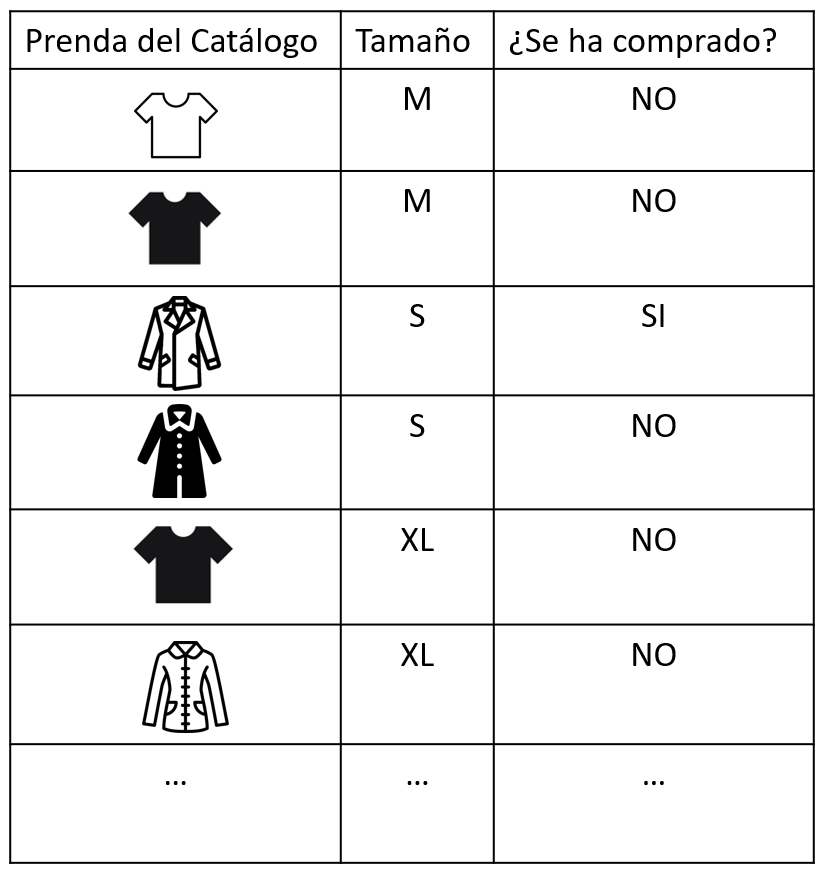

,tamanio,venta
camiseta-hombre-blanca,XS,NO
camiseta-unisex-gris,S,SI
abrigo-mujer-rojo,S,SI
camiseta-mujer-blanca,S,NO
camiseta-mujer-negra,M,NO
bufanda-unisex-gris,M,SI
abrigo-mujer-gris,M,NO
jersety-hombre-blanca,L,NO
camiseta-negra,XL,NO
abrigo-mujer-negro,XXL,NO


In [35]:
display(Image(filename="./recursos/imagenes/contentbased/cb_10.jpg"))
toy_log_df = pd.DataFrame({
    'tamanio':[
        'XS', 'S','S', 'S', 'M', 'M',
        'M', 'L', 'XL', 'XXL', 'XXL'
    ], 'venta':['NO', 'SI', 'SI', 'NO', 'NO', 'SI', 'NO', 'NO', 'NO', 'NO', 'NO']
}, index=[
    'camiseta-hombre-blanca', 'camiseta-unisex-gris','abrigo-mujer-rojo',
    'camiseta-mujer-blanca', 'camiseta-mujer-negra', 'bufanda-unisex-gris','abrigo-mujer-gris',
    'jersety-hombre-blanca', 'camiseta-negra','abrigo-mujer-negro',
     'camiseta-unisex-azul', 
])
toy_log_df

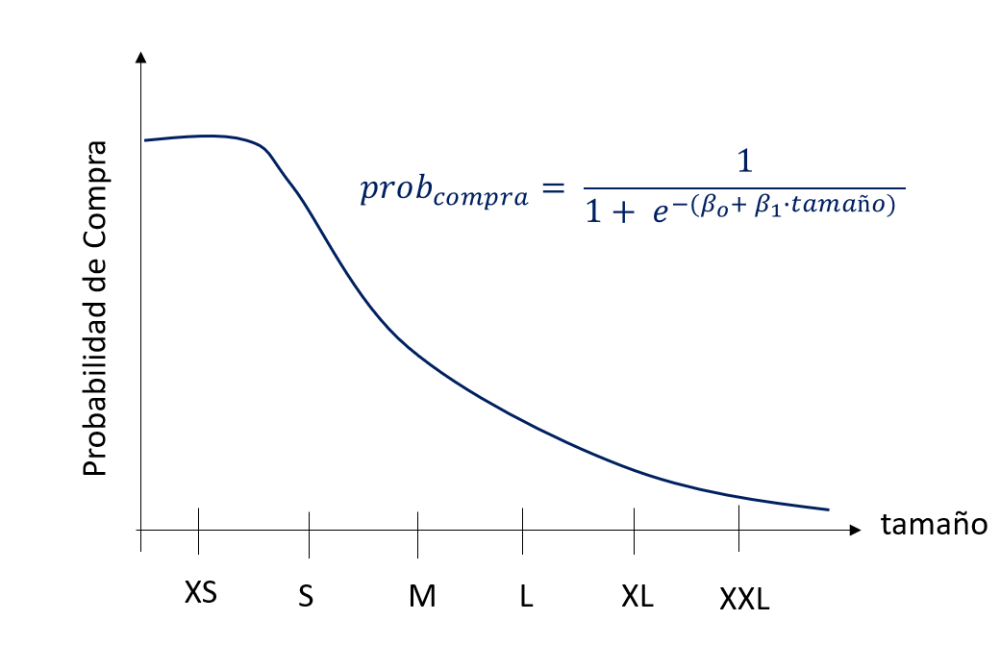

In [42]:
display(Image(filename="./recursos/imagenes/contentbased/cb_11.jpg"))

# STUDENT - CODE: Escribe la función Sigmoide 
def sigmoid(x, b0, b1):
    # STUDENT - CODE: Escribe la función Sigmoide 
    return


# SUDENT - CODE: Encuentra manualmente unos parámetros de la función sigmode que expliquen el comportamiento del cliente

fig = plt.figure(figsize=(15, 5))
x = np.arange(-10, 10)
b0 =  0
b1 = 0
sns.lineplot(x=x, y=sigmoid(x, b0, b1))
plt.show()



<p style="font-size: 16px; color: #002060;">Para no morir en el intento utilicemos scikit learn para que nos busque él solito los parámetros</p>

In [46]:
from sklearn.linear_model import LogisticRegression

toy_log_df['tamanio_encoded'] = toy_log_df['tamanio'].map({'XXS':0, 'XS':1,'S':2,'M':3,'L':4,'XL':5, 'XXL':6})
toy_log_df['sold'] = (toy_log_df['venta'] == 'SI').astype(np.uint8)
display(toy_log_df[['tamanio_encoded', 'sold']])
clf = LogisticRegression(random_state=0).fit(toy_log_df['tamanio_encoded'].values.reshape(-1, 1), toy_log_df['sold'].values)
b0, b1 = clf.intercept_, clf.coef_.flatten()

print(b0, b1)


x = np.arange(-5, 10)
sns.lineplot(x=x, y=sigmoid(x, b0, b1))
plt.show()

# STUDENT CODE: utiliza los parámetros para predecir la propensión a compra en base al tamaño codificado
toy_log_df['prediction'] = sigmoid(toy_log_df['tamanio_encoded'], b0, b1)
toy_log_df

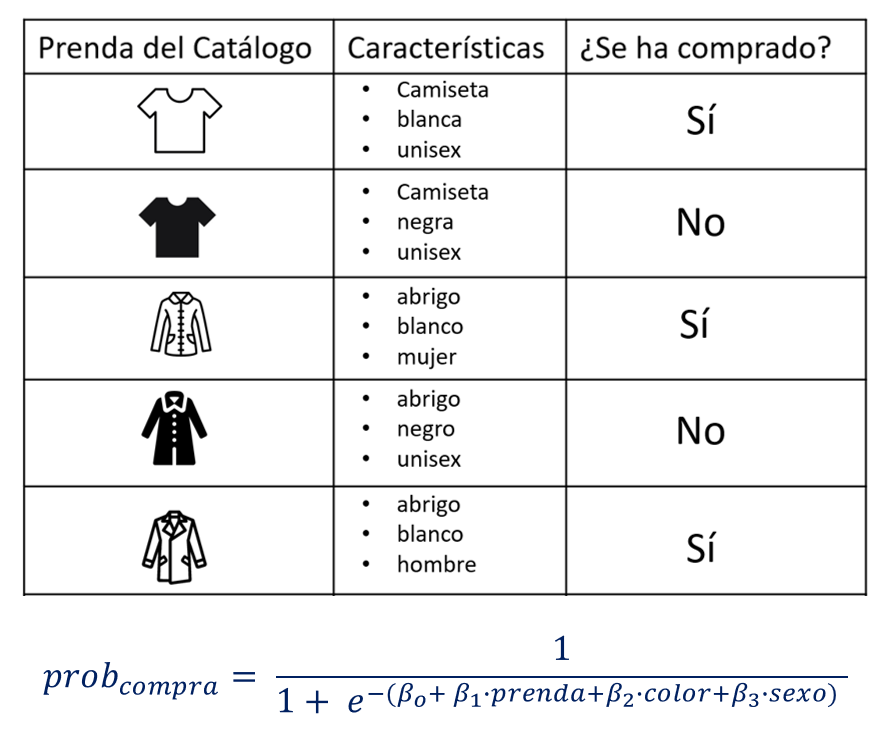

In [47]:
display(Image(filename="./recursos/imagenes/contentbased/cb_12.jpg"))

In [48]:
def logistic_recommender(customer_df, customer_id, full_articles_df, article_features, K):
    customer_sold_df = customer_df[article_features].drop_duplicates()
    customer_sold_df['sold'] = 1
    customer_not_sold_df = full_articles_df.loc[
        full_articles_df.cid != customer_id
    ][article_features].drop_duplicates(subset=['article_id'])
    
    customer_sold_oh_df = pd.get_dummies(
        customer_sold_df[article_features].set_index('article_id'), dummy_na=True
    )
    
    customer_not_sold_oh_df = pd.get_dummies(
        customer_not_sold_df[article_features].set_index('article_id'), dummy_na=True
    )
    common_oh_features = [c for c in customer_sold_oh_df.columns if c in customer_not_sold_oh_df]
    
    customer_sold_oh_df['sold'] = 1
    train_oh_df = pd.merge(customer_not_sold_oh_df, customer_sold_oh_df, how='left').fillna(0)[itertools.chain(
        *[common_oh_features, ['sold']])]
    
    recommendable_articles_oh_df = pd.get_dummies(
        full_articles_df.loc[full_articles_df.cid != customer_id]
        .drop_duplicates(subset=["article_id"])[article_features]
        .set_index("article_id"), dummy_na=True
    )[common_oh_features]

    recommendable_articles_oh_df['prediction'] = LogisticRegression(
        random_state=0
    ).fit(
        train_oh_df.drop(
            columns=['sold']
        ).values, train_oh_df['sold'].values
    ).predict_proba(recommendable_articles_oh_df.values)[:, -1]
    
    return recommendable_articles_oh_df.sort_values(
        by=['prediction']
    ).sort_values(by=['prediction'], ascending=False).head(K).index.tolist()

In [50]:
num_users = 30
selected_customers = df.groupby('cid')['product_type_name'].nunique().sort_values().head(
    num_users
).index

logistic_recommendations_df = pd.DataFrame(df.loc[df.cid.isin(selected_customers)].groupby(
    'cid'
).progress_apply(
    lambda x:  logistic_recommender(x, x.name, full_articles_df,  article_features, K)
).to_dict()).T
logistic_recommendations_df.head()
recommendation_sample = logistic_recommendations_df.sample(1).squeeze()
display(df.loc[df.cid == recommendation_sample.name][article_features].sample(5))
display(df.loc[df.article_id.isin(recommendation_sample.values)][article_features].drop_duplicates())

  0%|          | 0/30 [00:00<?, ?it/s]

,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
1324294,658030005,Trousers,Garment Lower body,Denim,Blue,Medium Dusty,Ladies Denim,Trousers Denim
388226,705988005,Trousers,Garment Lower body,All over pattern,Black,Dark,Divided Collection,Trousers
1168950,717490064,T-shirt,Garment Upper body,Embroidery,Black,Dark,Divided Basics,Jersey Basic
1290067,316441001,Top,Garment Upper body,Solid,Black,Dark,Womens Everyday Basics,Jersey Basic
14135,706016002,Trousers,Garment Lower body,Solid,Light Blue,Light,Divided Collection,Trousers


,article_id,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,section_name,garment_group_name
501435,731160005,Trousers,Garment Lower body,Denim,Blue,Medium Dusty,Ladies Denim,Trousers Denim
1017021,487827009,Trousers,Garment Lower body,Denim,Blue,Medium Dusty,Ladies Denim,Trousers Denim
1149690,690933005,Trousers,Garment Lower body,Denim,Blue,Medium Dusty,Womens Casual,Trousers


<h1 style="color: #f47b4c; margin-top: 25px;">¿Cuál funciona mejor?</h1>
<p style="font-size: 16px; color: #002060;"> Hemos visto varios modelos y algunas ejecuciones que parece que muestran resultados coherentes, pero.. cómo de buenos son nuestros modelos?.</p>

In [51]:
test_df = pd.read_csv('./recursos/datos/transactions_small_test.csv', dtype={'cid': 'object'})
selected_customers = test_df.cid.unique()

<h2 style="color: #f47b4c; margin-top: 25px;">Random Recommender</h2>
<p style="font-size: 16px; color: #002060;"> A continuación se probará un modelo random que recomiende productos de manera aleatoria.</p>

In [52]:
baseline_recommendations_df = pd.DataFrame(df.loc[df.cid.isin(
    selected_customers
)].groupby('cid').progress_apply(
    lambda x: np.random.choice(
        full_articles_df.loc[full_articles_df.cid != x.name, 'article_id'].unique(), K).tolist()
).to_dict()).T

recommendations_df = baseline_recommendations_df.stack().reset_index()
recommendations_df.columns = ['cid', 'score', 'article_id']
recommendations_df['article_id'] = recommendations_df['article_id'].astype(np.int64)


tools.get_metrics(
    name="random_products", 
    recommendations=recommendations_df, 
    sort_column="score",
    true_labels=test_df[["cid", "article_id", "interested"]], 
    articles_df=full_articles_oh_df,
)

  0%|          | 0/3682 [00:00<?, ?it/s]

General Precision@5            Recall@5  \
                Catalog coverage (%)        mean       std      mean   
                                                                       
random_products                100.0    0.007424  0.050406  0.002227   

                              MAP@5           Diversity            
                      std      mean       std      mean       std  
                                                                   
random_products  0.015122  0.004979  0.037425  0.759473  0.142852

<h2 style="color: #f47b4c; margin-top: 25px;">Naive Content-Based Method</h2>
<p style="font-size: 16px; color: #002060;"> A continuación se probará el modelo de que hemos hecho juntos de producto escalar de matrices para estimar los productos que comprará cada usuario en el test.</p>

In [53]:
naive_recommendations_df = pd.DataFrame(
    df.loc[df.cid.isin(selected_customers)].groupby(
        'cid'
    ).progress_apply(
lambda x:  recommend_user(x, x.name, full_articles_df, K, algorithm='naive')
).to_dict()).T

recommendations_df = naive_recommendations_df.stack().reset_index()
recommendations_df.columns = ['cid', 'score', 'article_id']
recommendations_df['article_id'] = recommendations_df['article_id'].astype(np.int64)

tools.get_metrics(
    name="naive", 
    recommendations=recommendations_df, 
    sort_column="score",
    true_labels=test_df[["cid", "article_id", "interested"]], 
    articles_df=full_articles_oh_df,
)

  0%|          | 0/3682 [00:00<?, ?it/s]

General Precision@5            Recall@5            \
      Catalog coverage (%)        mean       std      mean       std   
                                                                       
naive               0.2278    0.003893  0.036649  0.001168  0.010995   

          MAP@5          Diversity                
           mean      std      mean           std  
                                                  
naive  0.002324  0.02401  0.761905  1.765494e-14

<h2 style="color: #f47b4c; margin-top: 25px;">ML-Sigmoid Method</h2>
<p style="font-size: 16px; color: #002060;"> A continuación se probará el modelo de ML sencillo (sigmoide) entrenado un único modelo para cada usuario (ya que estamos en content-based) y tratará de predecir utilizando una regresión logística los productos que comprará el usuario en el test</p>

In [54]:
logistic_recommendations_df = pd.DataFrame(
    df.loc[df.cid.isin(selected_customers)].groupby(
        'cid'
    ).progress_apply(
lambda x:   logistic_recommender(x, x.name, full_articles_df,  article_features, K)
).to_dict()).T

recommendations_df = logistic_recommendations_df.stack().reset_index()
recommendations_df.columns = ['cid', 'score', 'article_id']
recommendations_df['article_id'] = recommendations_df['article_id'].astype(np.int64)

tools.get_metrics(
    name="sigmoid", 
    recommendations=recommendations_df, 
    sort_column="score",
    true_labels=test_df[["cid", "article_id", "interested"]], 
    articles_df=full_articles_oh_df
)

  0%|          | 0/3682 [00:00<?, ?it/s]

General Precision@5            Recall@5            \
        Catalog coverage (%)        mean       std      mean       std   
                                                                         
sigmoid              70.8428    0.053956  0.128792  0.016187  0.038638   

            MAP@5           Diversity            
             mean       std      mean       std  
                                                 
sigmoid  0.034658  0.093364  0.696619  0.156827

<p style="font-size: 16px; color: #002060;"> Parece que este enfoque a pesar de disponer de poco histórico para ciertos usuarios es capaz de rankear decentemente los productos.. si cada modelo de boosting ha sido capaz de encontrar patrones fijándose solo en un único cliente.. imagina lo que puede ser creáramos modelos que pudieran alimentarse de lo que han hecho otro tipo de usuarios similares..</p>